In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_score, confusion_matrix, recall_score, f1_score 

# 1. Loading the dataset and understanding data

In [2]:
df = pd.read_csv('../data/heart_attack_prediction_dataset.csv')

## 1.1 preview of the first 5 rows of data

In [3]:
df.head()

,Patient ID,Age,Sex,Cholesterol,Blood Pressure,Heart Rate,Diabetes,Family History,Smoking,Obesity,...,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,BMW7812,67,Male,208,158/88,72,0,0,1,0,...,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,0
1,CZE1114,21,Male,389,165/93,98,1,1,1,1,...,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,0
2,BNI9906,21,Female,324,174/99,72,1,0,0,0,...,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,0
3,JLN3497,84,Male,383,163/100,73,1,1,1,0,...,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,0
4,GFO8847,66,Male,318,91/88,93,1,1,1,1,...,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,0


## 1.2 Shape of data

In [4]:
df.shape

(8763, 26)

## 1.3 Datatype of columns

In [5]:
df.dtypes

Patient ID                          object
Age                                  int64
Sex                                 object
Cholesterol                          int64
Blood Pressure                      object
Heart Rate                           int64
Diabetes                             int64
Family History                       int64
Smoking                              int64
Obesity                              int64
Alcohol Consumption                  int64
Exercise Hours Per Week            float64
Diet                                object
Previous Heart Problems              int64
Medication Use                       int64
Stress Level                         int64
Sedentary Hours Per Day            float64
Income                               int64
BMI                                float64
Triglycerides                        int64
Physical Activity Days Per Week      int64
Sleep Hours Per Day                  int64
Country                             object
Continent  

## 1.4 Checking for the null value

In [6]:
df.isna().sum()
# data is clean

Patient ID                         0
Age                                0
Sex                                0
Cholesterol                        0
Blood Pressure                     0
Heart Rate                         0
Diabetes                           0
Family History                     0
Smoking                            0
Obesity                            0
Alcohol Consumption                0
Exercise Hours Per Week            0
Diet                               0
Previous Heart Problems            0
Medication Use                     0
Stress Level                       0
Sedentary Hours Per Day            0
Income                             0
BMI                                0
Triglycerides                      0
Physical Activity Days Per Week    0
Sleep Hours Per Day                0
Country                            0
Continent                          0
Hemisphere                         0
Heart Attack Risk                  0
dtype: int64

## 1.5 Number of unique values in each column

In [7]:
df.nunique()

Patient ID                         8763
Age                                  73
Sex                                   2
Cholesterol                         281
Blood Pressure                     3915
Heart Rate                           71
Diabetes                              2
Family History                        2
Smoking                               2
Obesity                               2
Alcohol Consumption                   2
Exercise Hours Per Week            8763
Diet                                  3
Previous Heart Problems               2
Medication Use                        2
Stress Level                         10
Sedentary Hours Per Day            8763
Income                             8615
BMI                                8763
Triglycerides                       771
Physical Activity Days Per Week       8
Sleep Hours Per Day                   7
Country                              20
Continent                             6
Hemisphere                            2


In [8]:
df['Diet'].value_counts()

Diet
Healthy      2960
Average      2912
Unhealthy    2891
Name: count, dtype: int64

# 2. Exploratory Data Analysis

## 2.1 Separating the columns in categorical and continuous

In [9]:
# how to deal with the 'Blood pressure' and 'diet' ?

features = ['Age', 'Cholesterol', 'Heart Rate','Diabetes','Family History', 'Smoking', 'Obesity', 'Alcohol Consumption','Exercise Hours Per Week','Previous Heart Problems', 'Medication Use', 'Stress Level','Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides','Physical Activity Days Per Week', 'Sleep Hours Per Day']

list_continuous = ['Age', 'Cholesterol', 'Heart Rate', 'Exercise Hours Per Week', 'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides','Physical Activity Days Per Week', 'Sleep Hours Per Day']

list_categorical = ['Sex','Diabetes','Family History', 'Smoking', 'Obesity', 'Alcohol Consumption', 'Diet','Previous Heart Problems', 'Medication Use', 'Stress Level', 'Country', 'Continent','Hemisphere']

## 2.2 Count plot of categorical features

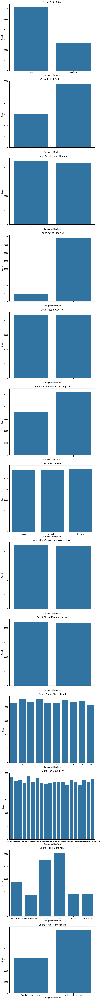

In [10]:
# Create subplots
fig, axes = plt.subplots(nrows=len(list_categorical), ncols=1, figsize=(8, 6 * len(list_categorical)))

# Iterate over categorical features and plot count plot for each
for i, cat_feature in enumerate(list_categorical):
    sns.countplot(x=cat_feature, data=df, ax=axes[i])
    axes[i].set_xlabel('Categorical Feature')
    axes[i].set_ylabel('Count')
    axes[i].set_title(f'Count Plot of {cat_feature}')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

## 2.3 Correlation matrix of continuous features

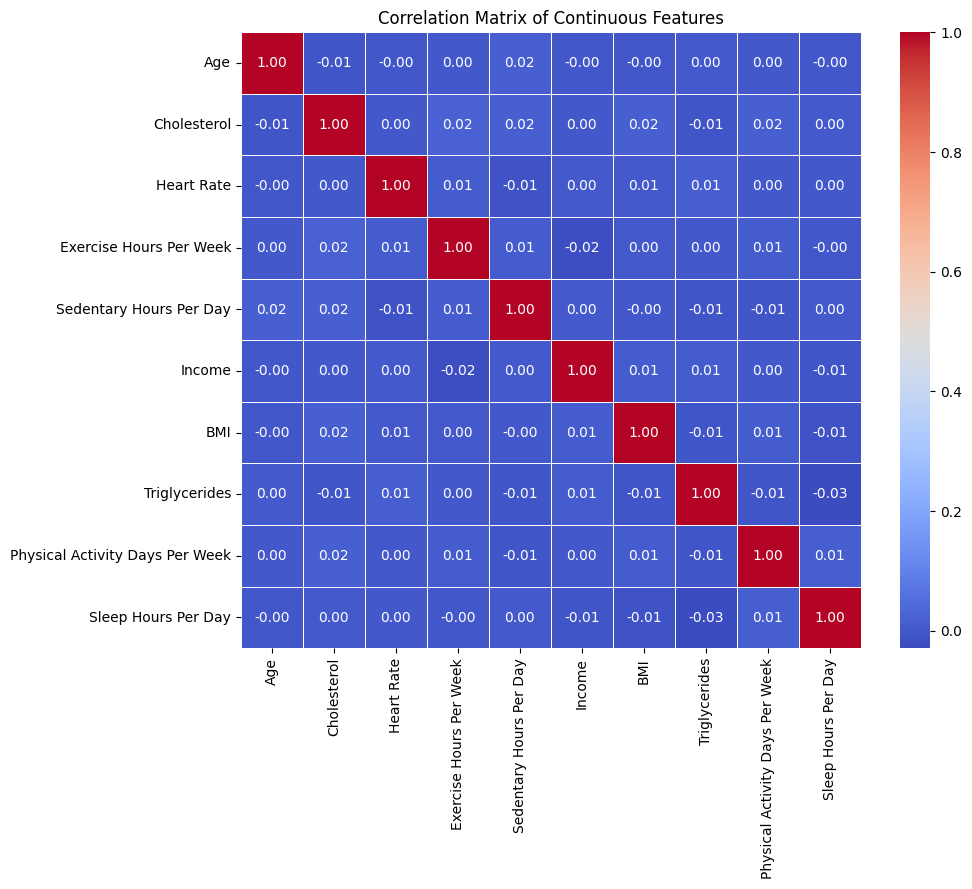

In [11]:
# Create df with continuous features
continuous_df = df[list_continuous]

# Calculate correlation matrix
corr_matrix = continuous_df.corr()

# Plot correlation matrix using heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Continuous Features')
plt.show()

## 2.4 Heatmap of dataframe

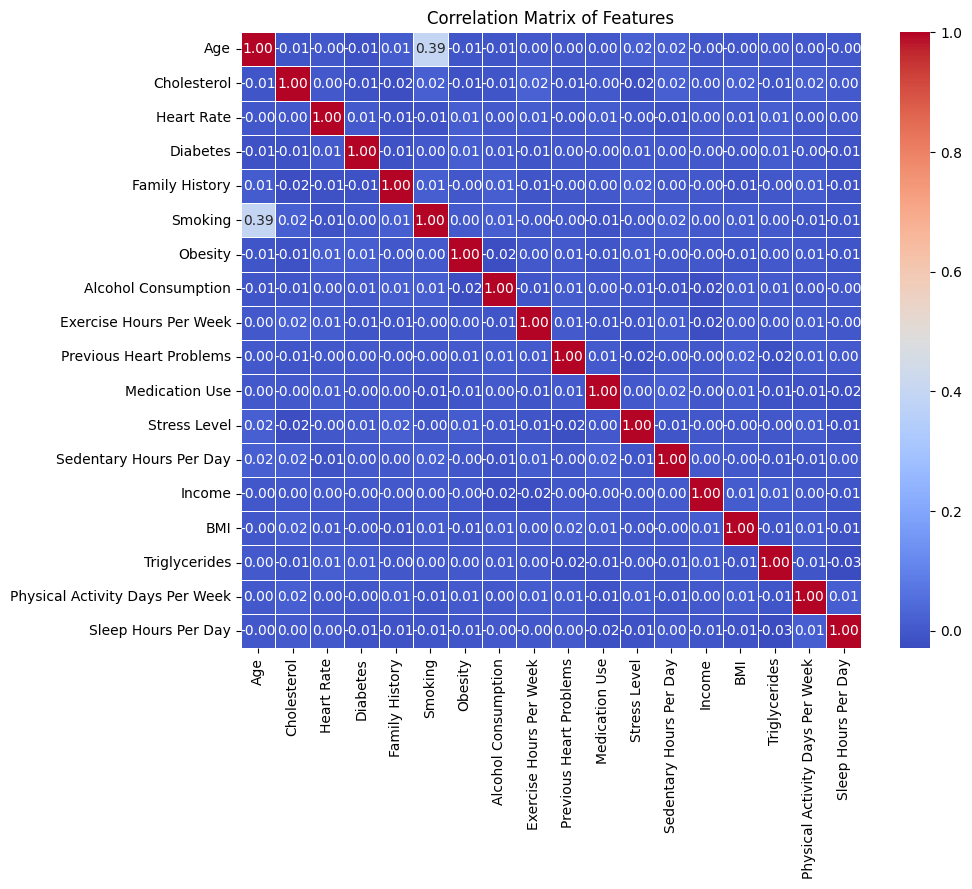

In [13]:
features_df = df[features]

# Calculate correlation matrix
corr_matrix2 = features_df.corr()

# Plot correlation matrix using heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix2, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Features')
plt.show()

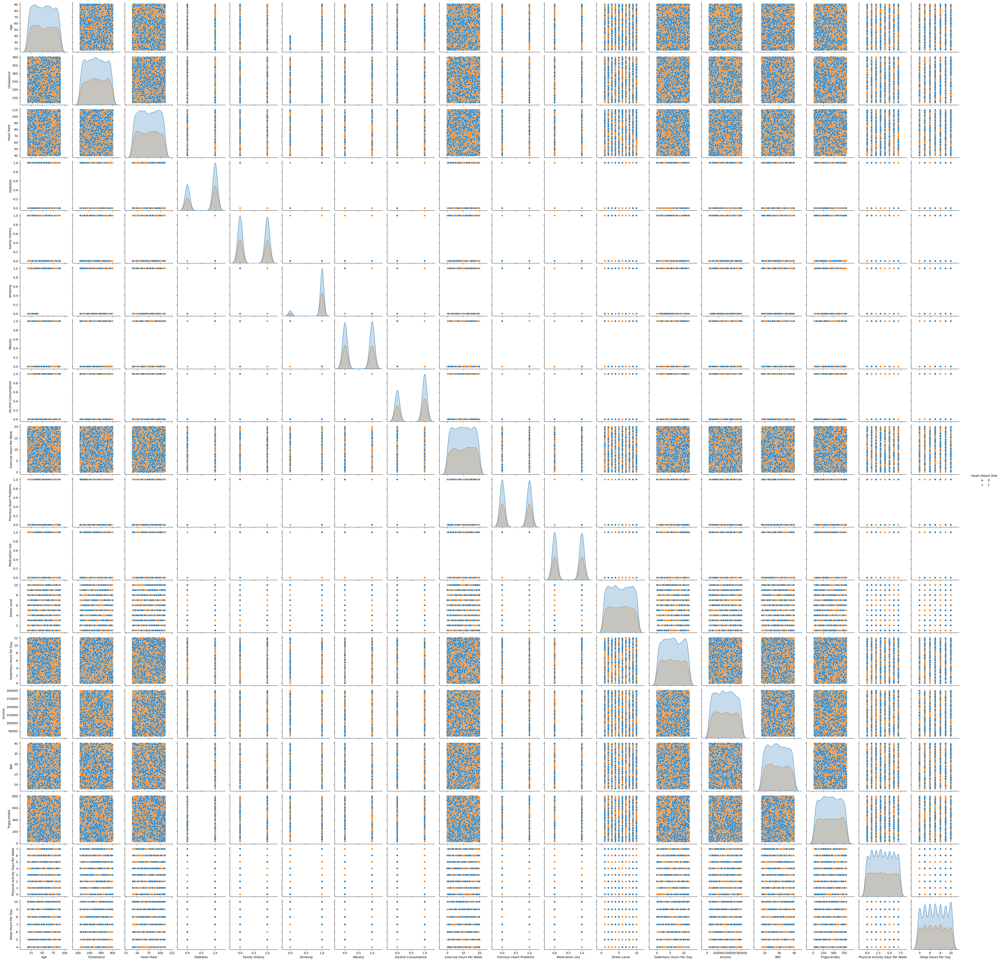

In [13]:
sns.pairplot(df, hue="Heart Attack Risk")

# 3. KNN

In [28]:

df_num= df[features]
df_num=df_num.rename(columns={'Sleep Hours Per Day':'target'})
df_num

,Age,Cholesterol,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,target,Heart Attack Risk
0,67,208,72,0,0,1,0,0,4.168189,0,0,9,6.615001,261404,31.251233,286,0,6,0
1,21,389,98,1,1,1,1,1,1.813242,1,0,1,4.963459,285768,27.194973,235,1,7,0
2,21,324,72,1,0,0,0,0,2.078353,1,1,9,9.463426,235282,28.176571,587,4,4,0
3,84,383,73,1,1,1,0,1,9.828130,1,0,9,7.648981,125640,36.464704,378,3,4,0
4,66,318,93,1,1,1,1,0,5.804299,1,0,6,1.514821,160555,21.809144,231,1,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8758,60,121,61,1,1,1,0,1,7.917342,1,1,8,10.806373,235420,19.655895,67,7,7,0
8759,28,120,73,1,0,0,1,0,16.558426,0,0,8,3.833038,217881,23.993866,617,4,9,0
8760,47,250,105,0,1,1,1,1,3.148438,1,0,5,2.375214,36998,35.406146,527,4,4,1
8761,36,178,60,1,0,1,0,0,3.789950,1,1,5,0.029104,209943,27.294020,114,2,8,0


In [29]:
features = df_num.drop(columns = ["target"])
target = df_num["target"]

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.20, random_state=0)


In [39]:
knn = KNeighborsRegressor(n_neighbors=2)
knn.fit(X_train, y_train)


KNeighborsRegressor(n_neighbors=2)

In [40]:
knn.score(X_test, y_test)

-0.47116311973945146

In [45]:
knn2 = KNeighborsRegressor(n_neighbors=4)
knn2.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=4)

In [46]:
knn2.score(X_test, y_test)

-0.2216846962596064

In [49]:
list_numerical = ['Age', 'Cholesterol', 'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity', 'Alcohol Consumption', 'Exercise Hours Per Week', 'Previous Heart Problems', 'Medication Use', 'Stress Level','Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides','Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Heart Attack Risk']
df_num= df[list_numerical]
df_num=df_num.rename(columns={'Heart Attack Risk':'target'})
df_num

,Age,Cholesterol,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,target
0,67,208,72,0,0,1,0,0,4.168189,0,0,9,6.615001,261404,31.251233,286,0,6,0
1,21,389,98,1,1,1,1,1,1.813242,1,0,1,4.963459,285768,27.194973,235,1,7,0
2,21,324,72,1,0,0,0,0,2.078353,1,1,9,9.463426,235282,28.176571,587,4,4,0
3,84,383,73,1,1,1,0,1,9.828130,1,0,9,7.648981,125640,36.464704,378,3,4,0
4,66,318,93,1,1,1,1,0,5.804299,1,0,6,1.514821,160555,21.809144,231,1,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8758,60,121,61,1,1,1,0,1,7.917342,1,1,8,10.806373,235420,19.655895,67,7,7,0
8759,28,120,73,1,0,0,1,0,16.558426,0,0,8,3.833038,217881,23.993866,617,4,9,0
8760,47,250,105,0,1,1,1,1,3.148438,1,0,5,2.375214,36998,35.406146,527,4,4,1
8761,36,178,60,1,0,1,0,0,3.789950,1,1,5,0.029104,209943,27.294020,114,2,8,0


In [50]:
features = df_num.drop(columns = ["target"])
target = df_num["target"]

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.20, random_state=0)

In [53]:
knn3 = KNeighborsClassifier(n_neighbors=3) # we can change the number of neighbours of course
knn3.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [54]:
knn3.score(X_test, y_test)

AttributeError: 'Flags' object has no attribute 'c_contiguous'

In [55]:
pred = knn.predict(X_test)


sns.heatmap(confusion_matrix(y_test, pred), annot = True)

NotFittedError: This KNeighborsClassifier instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.